In [30]:
%matplotlib inline
# import tensorflow as tf
# from tensorflow.python.client import device_lib
# local_device_protos = device_lib.list_local_devices()
# gpuname = [x.name for x in local_device_protos if x.device_type == 'GPU']
# tf.device(gpuname)
# import keras
import json
from pycocotools.coco import COCO
import numpy as np
import pandas as pd
import skimage.io as io
import matplotlib.pyplot as plt
import pylab
import copy
import os
import sys
import cv2
import matplotlib.patches as patches
pylab.rcParams['figure.figsize'] = (8.0, 10.0)

### Loading the Train/Val/Test annotation files

In [31]:
dataDir='data'
annTrainFile='{}/annotations/instances_train2017.json'.format(dataDir)
annValFile='{}/annotations/instances_val2017.json'.format(dataDir)
annTestFile='{}/annotations/image_info_test2017.json'.format(dataDir)

### Using COCO API

In [32]:
cocoTrain=COCO(annTrainFile)
cocoVal=COCO(annValFile)
cocoTest=COCO(annTestFile)

loading annotations into memory...
Done (t=15.77s)
creating index...
index created!
loading annotations into memory...
Done (t=0.66s)
creating index...
index created!
loading annotations into memory...
Done (t=0.17s)
creating index...
index created!


### Listing all the categories of images in training data

In [7]:
cats = cocoTrain.loadCats(cocoTrain.getCatIds())
nms=[cat['name'] for cat in cats]
print('COCO Train categories: \n{}\n'.format(' '.join(nms)))
catIds = cocoTrain.getCatIds(catNms=nms)
imgIds = cocoTrain.getImgIds(catIds=catIds)

COCO Train categories: 
person bicycle car motorcycle airplane bus train truck boat traffic light fire hydrant stop sign parking meter bench bird cat dog horse sheep cow elephant bear zebra giraffe backpack umbrella handbag tie suitcase frisbee skis snowboard sports ball kite baseball bat baseball glove skateboard surfboard tennis racket bottle wine glass cup fork knife spoon bowl banana apple sandwich orange broccoli carrot hot dog pizza donut cake chair couch potted plant bed dining table toilet tv laptop mouse remote keyboard cell phone microwave oven toaster sink refrigerator book clock vase scissors teddy bear hair drier toothbrush



In [8]:
annsTrain = cocoTrain.loadAnns(cocoTrain.getAnnIds())
bboxTrain = [x['bbox'] for x in annsTrain]
imgIdTrain = [x['image_id'] for x in annsTrain]

In [9]:
len(bboxTrain)

860001

There are **8,60,001** different annotations in the training set

In [10]:
dir = 'data/coco/train2017/'
imgTrainFileNms = os.listdir(dir)

In [17]:
len(imgTrainFileNms)

118287

There are **1,18,287** training images

In [11]:
imgTrainNms = []
for i in imgTrainFileNms:
    i = i.replace('.jpg','')
    i = i.lstrip('0')
    i = int(i)
    imgTrainNms.append(i)

### Getting all the annotations per image

In [12]:
# lambda x in annsTrain if x['image_id'] is 
annsForImg = cocoTrain.imgToAnns

In [13]:
annsForImg

defaultdict(list,
            {558840: [{'segmentation': [[239.97,
                 260.24,
                 222.04,
                 270.49,
                 199.84,
                 253.41,
                 213.5,
                 227.79,
                 259.62,
                 200.46,
                 274.13,
                 202.17,
                 277.55,
                 210.71,
                 249.37,
                 253.41,
                 237.41,
                 264.51,
                 242.54,
                 261.95,
                 228.87,
                 271.34]],
               'area': 2765.1486500000005,
               'iscrowd': 0,
               'image_id': 558840,
               'bbox': [199.84, 200.46, 77.71, 70.88],
               'category_id': 58,
               'id': 156},
              {'segmentation': [[357.57,
                 210.37,
                 338.46,
                 209.92,
                 327.55,
                 204.0,
                 32

In [16]:
len(annsForImg)

117266

This means that there is are some images which have no objects in them

In [26]:
keys = annsForImg.keys()
noLabelImg = []
for i in imgTrainNms:
    if i not in keys:
        noLabelImg.append(i)

In [27]:
len(noLabelImg)

1021

Yes, **1021** images have no objects in them. Hence removing them from the training set

In [29]:
imgTrainFileNmsForRemoval = os.listdir(dir)
for i in imgTrainFileNmsForRemoval:
    j = i.replace('.jpg','')
    j = j.lstrip('0')
    j = int(j)
    if j in noLabelImg:
        print(dir+i)
        os.remove(dir+i)

data/coco/train2017/000000108169.jpg
data/coco/train2017/000000181035.jpg
data/coco/train2017/000000424980.jpg
data/coco/train2017/000000505865.jpg
data/coco/train2017/000000079913.jpg
data/coco/train2017/000000531488.jpg
data/coco/train2017/000000498563.jpg
data/coco/train2017/000000007823.jpg
data/coco/train2017/000000450343.jpg
data/coco/train2017/000000291056.jpg
data/coco/train2017/000000084638.jpg
data/coco/train2017/000000113185.jpg
data/coco/train2017/000000486769.jpg
data/coco/train2017/000000238141.jpg
data/coco/train2017/000000038435.jpg
data/coco/train2017/000000403279.jpg
data/coco/train2017/000000566670.jpg
data/coco/train2017/000000257034.jpg
data/coco/train2017/000000030175.jpg
data/coco/train2017/000000449082.jpg
data/coco/train2017/000000474398.jpg
data/coco/train2017/000000391537.jpg
data/coco/train2017/000000029056.jpg
data/coco/train2017/000000464210.jpg
data/coco/train2017/000000310688.jpg
data/coco/train2017/000000237860.jpg
data/coco/train2017/000000334642.jpg
d

data/coco/train2017/000000299441.jpg
data/coco/train2017/000000302945.jpg
data/coco/train2017/000000226128.jpg
data/coco/train2017/000000076923.jpg
data/coco/train2017/000000135849.jpg
data/coco/train2017/000000239942.jpg
data/coco/train2017/000000386613.jpg
data/coco/train2017/000000245810.jpg
data/coco/train2017/000000214036.jpg
data/coco/train2017/000000465211.jpg
data/coco/train2017/000000281188.jpg
data/coco/train2017/000000402386.jpg
data/coco/train2017/000000542695.jpg
data/coco/train2017/000000487702.jpg
data/coco/train2017/000000262284.jpg
data/coco/train2017/000000156606.jpg
data/coco/train2017/000000368750.jpg
data/coco/train2017/000000449316.jpg
data/coco/train2017/000000521098.jpg
data/coco/train2017/000000071879.jpg
data/coco/train2017/000000275245.jpg
data/coco/train2017/000000186441.jpg
data/coco/train2017/000000268496.jpg
data/coco/train2017/000000265207.jpg
data/coco/train2017/000000094792.jpg
data/coco/train2017/000000297058.jpg
data/coco/train2017/000000487516.jpg
d

data/coco/train2017/000000375611.jpg
data/coco/train2017/000000303287.jpg
data/coco/train2017/000000535233.jpg
data/coco/train2017/000000040474.jpg
data/coco/train2017/000000413120.jpg
data/coco/train2017/000000361774.jpg
data/coco/train2017/000000451373.jpg
data/coco/train2017/000000326613.jpg
data/coco/train2017/000000099364.jpg
data/coco/train2017/000000198037.jpg
data/coco/train2017/000000424528.jpg
data/coco/train2017/000000103341.jpg
data/coco/train2017/000000482826.jpg
data/coco/train2017/000000228407.jpg
data/coco/train2017/000000062824.jpg
data/coco/train2017/000000570045.jpg
data/coco/train2017/000000039847.jpg
data/coco/train2017/000000548690.jpg
data/coco/train2017/000000092604.jpg
data/coco/train2017/000000345391.jpg
data/coco/train2017/000000501121.jpg
data/coco/train2017/000000315846.jpg
data/coco/train2017/000000358795.jpg
data/coco/train2017/000000187882.jpg
data/coco/train2017/000000576119.jpg
data/coco/train2017/000000449546.jpg
data/coco/train2017/000000505637.jpg
d

data/coco/train2017/000000379138.jpg
data/coco/train2017/000000156299.jpg
data/coco/train2017/000000028806.jpg
data/coco/train2017/000000125182.jpg
data/coco/train2017/000000379190.jpg
data/coco/train2017/000000090171.jpg
data/coco/train2017/000000260501.jpg
data/coco/train2017/000000405459.jpg
data/coco/train2017/000000361323.jpg
data/coco/train2017/000000062805.jpg
data/coco/train2017/000000336777.jpg
data/coco/train2017/000000209969.jpg
data/coco/train2017/000000497257.jpg
data/coco/train2017/000000344618.jpg
data/coco/train2017/000000504524.jpg
data/coco/train2017/000000011076.jpg
data/coco/train2017/000000520316.jpg
data/coco/train2017/000000567234.jpg
data/coco/train2017/000000023017.jpg
data/coco/train2017/000000262623.jpg
data/coco/train2017/000000571242.jpg
data/coco/train2017/000000228415.jpg
data/coco/train2017/000000268693.jpg
data/coco/train2017/000000415659.jpg
data/coco/train2017/000000519359.jpg
data/coco/train2017/000000029594.jpg
data/coco/train2017/000000083246.jpg
d

data/coco/train2017/000000097779.jpg
data/coco/train2017/000000154885.jpg
data/coco/train2017/000000124509.jpg
data/coco/train2017/000000406677.jpg
data/coco/train2017/000000415714.jpg
data/coco/train2017/000000377234.jpg
data/coco/train2017/000000022098.jpg
data/coco/train2017/000000400309.jpg
data/coco/train2017/000000371863.jpg
data/coco/train2017/000000012494.jpg
data/coco/train2017/000000106464.jpg
data/coco/train2017/000000509036.jpg
data/coco/train2017/000000101073.jpg
data/coco/train2017/000000459590.jpg
data/coco/train2017/000000395185.jpg
data/coco/train2017/000000479316.jpg
data/coco/train2017/000000548171.jpg
data/coco/train2017/000000193077.jpg
data/coco/train2017/000000297736.jpg
data/coco/train2017/000000211665.jpg
data/coco/train2017/000000021166.jpg
data/coco/train2017/000000169722.jpg
data/coco/train2017/000000029564.jpg
data/coco/train2017/000000324094.jpg
data/coco/train2017/000000572585.jpg
data/coco/train2017/000000277329.jpg
data/coco/train2017/000000228727.jpg
d

**Loading final set of training images**

In [31]:
finalImgTrainFileNms = os.listdir(dir)
finalImgTrainNms = []
for i in finalImgTrainFileNms:
    i = i.replace('.jpg','')
    i = i.lstrip('0')
    i = int(i)
    finalImgTrainNms.append(i)

## Cleaning Validation dataset

In [32]:
annsVal = cocoVal.loadAnns(cocoVal.getAnnIds())
bboxVal = [x['bbox'] for x in annsVal]
imgIdVal = [x['image_id'] for x in annsVal]

In [34]:
val_dir = 'data/coco/val2017/'
imgValFileNms = os.listdir(val_dir)

In [35]:
len(imgValFileNms)

5000

In [36]:
imgValNms = []
for i in imgValFileNms:
    i = i.replace('.jpg','')
    i = i.lstrip('0')
    i = int(i)
    imgValNms.append(i)

In [37]:
annsValForImg = cocoVal.imgToAnns

In [38]:
len(annsValForImg)

4952

In [39]:
keys = annsValForImg.keys()
noValLabelImg = []
for i in imgValNms:
    if i not in keys:
        noValLabelImg.append(i)
len(noValLabelImg)

48

In [40]:
imgValFileNmsForRemoval = os.listdir(val_dir)
for i in imgValFileNmsForRemoval:
    j = i.replace('.jpg','')
    j = j.lstrip('0')
    j = int(j)
    if j in noValLabelImg:
        print(val_dir+i)
        os.remove(val_dir+i)

data/coco/val2017/000000344611.jpg
data/coco/val2017/000000042888.jpg
data/coco/val2017/000000226111.jpg
data/coco/val2017/000000278006.jpg
data/coco/val2017/000000542073.jpg
data/coco/val2017/000000261796.jpg
data/coco/val2017/000000458790.jpg
data/coco/val2017/000000312549.jpg
data/coco/val2017/000000382734.jpg
data/coco/val2017/000000556498.jpg
data/coco/val2017/000000270386.jpg
data/coco/val2017/000000477118.jpg
data/coco/val2017/000000260657.jpg
data/coco/val2017/000000121153.jpg
data/coco/val2017/000000041488.jpg
data/coco/val2017/000000560371.jpg
data/coco/val2017/000000101022.jpg
data/coco/val2017/000000058636.jpg
data/coco/val2017/000000049091.jpg
data/coco/val2017/000000064574.jpg
data/coco/val2017/000000308391.jpg
data/coco/val2017/000000404601.jpg
data/coco/val2017/000000310622.jpg
data/coco/val2017/000000481404.jpg
data/coco/val2017/000000240767.jpg
data/coco/val2017/000000476491.jpg
data/coco/val2017/000000025593.jpg
data/coco/val2017/000000176701.jpg
data/coco/val2017/00

**Loading final validation dataset**

In [41]:
finalImgValFileNms = os.listdir(val_dir)
finalImgValNms = []
for i in finalImgValFileNms:
    i = i.replace('.jpg','')
    i = i.lstrip('0')
    i = int(i)
    finalImgValNms.append(i)

## Data Augmentation

In [44]:
finalImgTrainFileNmsFullPath = []
for i in finalImgTrainFileNms:
    finalImgTrainFileNmsFullPath.append('data/coco/train2017/'+i)

### Testing the flipping of boundary box

In [46]:
ii = cv2.imread(finalImgTrainFileNmsFullPath[0])

In [106]:
ii.shape

(455, 640, 3)

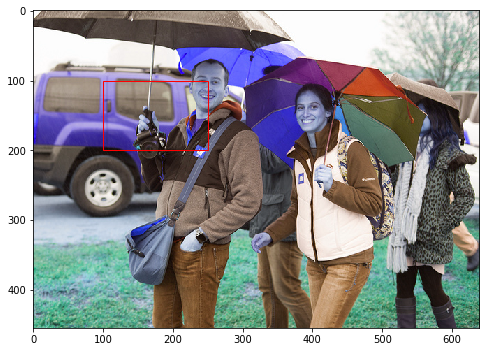

In [108]:
fig,ax = plt.subplots(1)
rect = patches.Rectangle((100,100),150,100,linewidth=1,edgecolor='r',facecolor='none')
ax.add_patch(rect)
plt.imshow(ii)
plt.show()

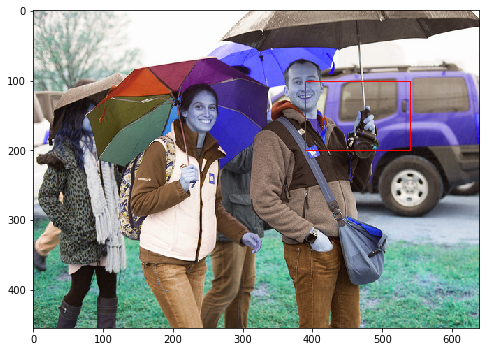

In [109]:
iii = cv2.flip(ii, 1)
fig,ax = plt.subplots(1)
rect = patches.Rectangle((640-(100+150),100),150,100,linewidth=1,edgecolor='r',facecolor='none')
ax.add_patch(rect)
plt.imshow(iii)
plt.show()

### Testing object bounding box resizing with image resizing

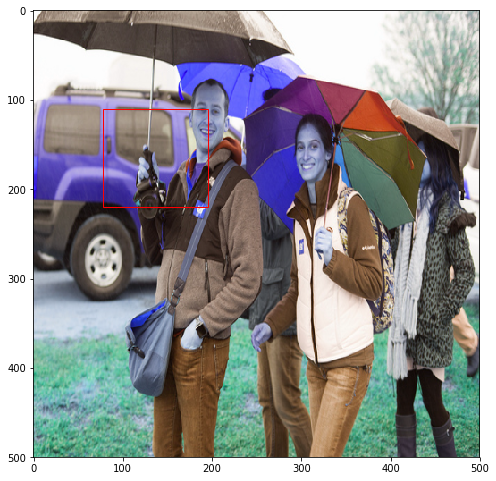

In [134]:
dim = 500,500
ii_re = cv2.resize(ii, dim, interpolation = cv2.INTER_AREA)
fig,ax = plt.subplots(1)
rect = patches.Rectangle((100*500/640,100*500/455),150*500/640,100*500/455,linewidth=1,edgecolor='r',facecolor='none')
ax.add_patch(rect)
plt.imshow(ii_re)
plt.show()

**Define a dataframe for image augmentation**

In [142]:
k = 0
fileList = []
bboxesList = []
categoryList = []
for j in finalImgTrainFileNmsFullPath:
    bboxesTrain = []
    categoryIds = []
    for i in annsForImg[finalImgTrainNms[k]]:
        bb = i['bbox']
        cc = {'x1' : bb[0], 'y1' : bb[1], 'x2' : bb[0]+bb[2], 'y2' : bb[1]+bb[3]}
        bboxesTrain.append(cc)
        categoryIds.append(i['category_id'])
    fileList.append(j)
    bboxesList.append(bboxesTrain)
    categoryList.append(categoryIds)
    k+=1
df = pd.DataFrame({'filepath' : fileList, 'bboxes' : bboxesList, 'category_ids' : categoryList})

In [144]:
df.head()

,filepath,bboxes,category_ids
0,data/coco/train2017/000000457868.jpg,"[{'x1': 302.65, 'y1': 69.6, 'x2': 564.54, 'y2'...","[28, 28, 28, 28, 1, 1, 1, 27, 31, 8, 1, 3, 1]"
1,data/coco/train2017/000000372220.jpg,"[{'x1': 426.24, 'y1': 503.83, 'x2': 461.92, 'y...","[77, 1, 1, 31, 1]"
2,data/coco/train2017/000000211935.jpg,"[{'x1': 596.67, 'y1': 377.58, 'x2': 640.0, 'y2...","[3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 8, 3, 3]"
3,data/coco/train2017/000000513983.jpg,"[{'x1': 158.97, 'y1': 20.65, 'x2': 562.58, 'y2...","[19, 61]"
4,data/coco/train2017/000000467951.jpg,"[{'x1': 125.69, 'y1': 245.87, 'x2': 351.53, 'y...","[86, 86, 67, 86]"


In [145]:
df.to_csv('final_train_path_bbox_category_for_augment.csv', index=False)

In [54]:
def augment(img_data, augment=True, hor_flip=True, ver_flip=True, rot_90=True, resize_dim=500):
    img_data_aug = img_data.copy(deep='all')
    img_o = cv2.imread(img_data_aug['filepath'])
    rows_o, cols_o = img_o.shape[:2]
    img = cv2.resize(img_o, (resize_dim, resize_dim), interpolation = cv2.INTER_AREA)
    for bbox in img_data_aug['bboxes']:
        bbox['x1'] *= resize_dim/cols_o
        bbox['y1'] *= resize_dim/rows_o
        bbox['x2'] *= resize_dim/cols_o
        bbox['y2'] *= resize_dim/rows_o
    if augment:
        rows, cols = img.shape[:2]
        if hor_flip and np.random.randint(0, 2) == 0:
            img = cv2.flip(img, 1)
            for bbox in img_data_aug['bboxes']:
                x1 = bbox['x1']
                x2 = bbox['x2']
                bbox['x2'] = cols - x1
                bbox['x1'] = cols - x2
        if ver_flip and np.random.randint(0, 2) == 0:
            img = cv2.flip(img, 0)
            for bbox in img_data_aug['bboxes']:
                y1 = bbox['y1']
                y2 = bbox['y2']
                bbox['y2'] = rows - y1
                bbox['y1'] = rows - y2
        if rot_90:
            angle = np.random.choice([0,90,180,270],1)[0]
            if angle == 270:
                img = np.transpose(img, (1,0,2))
                img = cv2.flip(img, 0)
            elif angle == 180:
                img = cv2.flip(img, -1)
            elif angle == 90:
                img = np.transpose(img, (1,0,2))
                img = cv2.flip(img, 1)
            elif angle == 0:
                pass

            for bbox in img_data_aug['bboxes']:
                x1 = bbox['x1']
                x2 = bbox['x2']
                y1 = bbox['y1']
                y2 = bbox['y2']
                if angle == 270:
                    bbox['x1'] = y1
                    bbox['x2'] = y2
                    bbox['y1'] = cols - x2
                    bbox['y2'] = cols - x1
                elif angle == 180:
                    bbox['x2'] = cols - x1
                    bbox['x1'] = cols - x2
                    bbox['y2'] = rows - y1
                    bbox['y1'] = rows - y2
                elif angle == 90:
                    bbox['x1'] = rows - y2
                    bbox['x2'] = rows - y1
                    bbox['y1'] = x1
                    bbox['y2'] = x2        
                elif angle == 0:
                    pass

    abc = img_data_aug['filepath'].split('/')
    img_data_aug['filepath'] = abc[0]+'/'+abc[1]+'/'+abc[2]+'/augmented/'+abc[3]
    return img_data_aug, img

In [71]:
df_aug_list = []
for index, row in df.iterrows():
    df_aug, aug_img = augment(row)
    df_aug_list.append(df_aug)
#     df_aug.to_csv('final_train_path_bbox_category_width_height_after_augment.csv', index=False)
    if not os.path.exists('data/coco/train2017/augmented'):
        os.makedirs('data/coco/train2017/augmented')
    cv2.imwrite(df_aug['filepath'], aug_img)

In [72]:
df_aug = pd.DataFrame(data=df_aug_list, columns=['filepath', 'bboxes', 'category_ids'])
df_aug.to_csv('final_train_path_bbox_category_after_augment.csv', index=False)

In [150]:
finalImgValFileNmsFullPath = []
for i in finalImgValFileNms:
    finalImgValFileNmsFullPath.append('data/coco/val2017/'+i)

In [151]:
k = 0
valFileList = []
valBboxesList = []
valCategoryList = []
for j in finalImgValFileNmsFullPath:
    bboxesTrain = []
    categoryIds = []
    for i in annsValForImg[finalImgValNms[k]]:
        bb = i['bbox']
        cc = {'x1' : bb[0], 'y1' : bb[1], 'x2' : bb[0]+bb[2], 'y2' : bb[1]+bb[3]}
        bboxesTrain.append(cc)
        categoryIds.append(i['category_id'])
    valFileList.append(j)
    valBboxesList.append(bboxesTrain)
    valCategoryList.append(categoryIds)
    k+=1
df_val = pd.DataFrame({'filepath' : valFileList, 'bboxes' : valBboxesList, 'category_ids' : valCategoryList})
df_val.head()

,filepath,bboxes,category_ids
0,data/coco/val2017/000000217219.jpg,"[{'x1': 0.81, 'y1': 2.47, 'x2': 639.75, 'y2': ...",[65]
1,data/coco/val2017/000000405972.jpg,"[{'x1': 114.46, 'y1': 17.65, 'x2': 428.64, 'y2...","[22, 22, 22]"
2,data/coco/val2017/000000047010.jpg,"[{'x1': 302.78, 'y1': 200.2, 'x2': 407.6099999...","[25, 25, 25, 21]"
3,data/coco/val2017/000000085823.jpg,"[{'x1': 149.69, 'y1': 0.67, 'x2': 395.33, 'y2'...","[24, 24, 24]"
4,data/coco/val2017/000000225184.jpg,"[{'x1': 192.65, 'y1': 353.24, 'x2': 234.9, 'y2...","[18, 20, 20, 20]"


In [152]:
df_val.to_csv('final_val_path_bbox_category_for_augment.csv', index=False)

In [58]:
df_val_aug_list = []
for index, row in df_val.iterrows():
    df_val_aug, aug_val_img = augment(row)
    df_val_aug_list.append(df_val_aug)
#     df_val_aug.to_csv('final_val_path_bbox_category_width_height_after_augment.csv', index=False)
    if not os.path.exists('data/coco/val2017/augmented'):
        os.makedirs('data/coco/val2017/augmented')
    cv2.imwrite(df_val_aug['filepath'], aug_val_img)

In [66]:
df_val_aug = pd.DataFrame(data=df_val_aug_list, columns=['filepath', 'bboxes', 'category_ids'])

In [68]:
df_val_aug.to_csv('final_val_path_bbox_category_after_augment.csv', index=False)

In [69]:
df = pd.read_csv('final_train_path_bbox_category_for_augment.csv', low_memory=False)

In [56]:
import ast
df_val.bboxes = df_val.bboxes.apply(lambda x : ast.literal_eval(x))

In [70]:
df.bboxes = df.bboxes.apply(lambda x : ast.literal_eval(x))

In [41]:
cats = cocoTrain.cats
keys = cats.keys()
catList = []
for k in keys:
    catList.append(cats[k])

In [42]:
catdf = pd.DataFrame(catList)
catdf.head()

,id,name,supercategory
0,1,person,person
1,2,bicycle,vehicle
2,3,car,vehicle
3,4,motorcycle,vehicle
4,5,airplane,vehicle


In [43]:
catdf.to_csv('categories.csv', index=False)

In [102]:
df_val_old = pd.read_csv('final_val_path_bbox_category_for_augment.csv', low_memory=False)
df_val_old.bboxes = df_val_old.bboxes.apply(lambda x : ast.literal_eval(x))

In [107]:
df_train_old = pd.read_csv('final_train_path_bbox_category_for_augment.csv', low_memory=False)
df_train_old.bboxes = df_train_old.bboxes.apply(lambda x : ast.literal_eval(x))

In [1]:
def resizeOriginalImages(row, resize_dim=100):
    img_o = cv2.imread(row['filepath'])
    rows_o, cols_o = img_o.shape[:2]
    img = cv2.resize(img_o, (resize_dim, resize_dim), interpolation = cv2.INTER_AREA)
    for bbox in row['bboxes']:
        bbox['x1'] *= resize_dim/cols_o
        bbox['y1'] *= resize_dim/rows_o
        bbox['x2'] *= resize_dim/cols_o
        bbox['y2'] *= resize_dim/rows_o
    cv2.imwrite(row['filepath'], img)

In [13]:
df_train_old = pd.read_csv('final_train_path_bbox_category_for_augment_after_resize.csv', low_memory=False)
df_train_old.bboxes = df_train_old.bboxes.apply(lambda x : ast.literal_eval(x))

In [14]:
df_train_old.head()

,filepath,bboxes,category_ids
0,data/coco/train2017/000000457868.jpg,"[{'x1': 236.44531249999997, 'y1': 76.483516483...","[28, 28, 28, 28, 1, 1, 1, 27, 31, 8, 1, 3, 1]"
1,data/coco/train2017/000000372220.jpg,"[{'x1': 461.2987012987013, 'y1': 393.6171875, ...","[77, 1, 1, 31, 1]"
2,data/coco/train2017/000000211935.jpg,"[{'x1': 466.14843749999994, 'y1': 443.16901408...","[3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 8, 3, 3]"
3,data/coco/train2017/000000513983.jpg,"[{'x1': 124.1953125, 'y1': 21.510416666666668,...","[19, 61]"
4,data/coco/train2017/000000467951.jpg,"[{'x1': 98.1953125, 'y1': 256.11458333333337, ...","[86, 86, 67, 86]"


In [15]:
for index, row in df_train_old.iterrows():
    resizeOriginalImages(row)

In [16]:
df_train_old.head()

,filepath,bboxes,category_ids
0,data/coco/train2017/000000457868.jpg,"[{'x1': 47.2890625, 'y1': 15.296703296703297, ...","[28, 28, 28, 28, 1, 1, 1, 27, 31, 8, 1, 3, 1]"
1,data/coco/train2017/000000372220.jpg,"[{'x1': 92.25974025974027, 'y1': 78.7234375, '...","[77, 1, 1, 31, 1]"
2,data/coco/train2017/000000211935.jpg,"[{'x1': 93.2296875, 'y1': 88.63380281690142, '...","[3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 8, 3, 3]"
3,data/coco/train2017/000000513983.jpg,"[{'x1': 24.8390625, 'y1': 4.302083333333334, '...","[19, 61]"
4,data/coco/train2017/000000467951.jpg,"[{'x1': 19.6390625, 'y1': 51.22291666666668, '...","[86, 86, 67, 86]"


In [104]:
df_val_old.head()

,filepath,bboxes,category_ids
0,data/coco/val2017/000000217219.jpg,"[{'x1': 0.81, 'y1': 2.47, 'x2': 639.75, 'y2': ...",[65]
1,data/coco/val2017/000000405972.jpg,"[{'x1': 114.46, 'y1': 17.65, 'x2': 428.64, 'y2...","[22, 22, 22]"
2,data/coco/val2017/000000047010.jpg,"[{'x1': 302.78, 'y1': 200.2, 'x2': 407.6099999...","[25, 25, 25, 21]"
3,data/coco/val2017/000000085823.jpg,"[{'x1': 149.69, 'y1': 0.67, 'x2': 395.33, 'y2'...","[24, 24, 24]"
4,data/coco/val2017/000000225184.jpg,"[{'x1': 192.65, 'y1': 353.24, 'x2': 234.9, 'y2...","[18, 20, 20, 20]"


In [8]:
df_val_old = pd.read_csv('final_val_path_bbox_category_for_augment_after_resize.csv', low_memory=False)
df_val_old.bboxes = df_val_old.bboxes.apply(lambda x : ast.literal_eval(x))

In [9]:
df_val_old.head()

,filepath,bboxes,category_ids
0,data/coco/val2017/000000217219.jpg,"[{'x1': 0.6328125, 'y1': 3.440111420612814, 'x...",[65]
1,data/coco/val2017/000000405972.jpg,"[{'x1': 89.421875, 'y1': 20.715962441314552, '...","[22, 22, 22]"
2,data/coco/val2017/000000047010.jpg,"[{'x1': 236.54687499999997, 'y1': 208.54166666...","[25, 25, 25, 21]"
3,data/coco/val2017/000000085823.jpg,"[{'x1': 116.9453125, 'y1': 0.7845433255269321,...","[24, 24, 24]"
4,data/coco/val2017/000000225184.jpg,"[{'x1': 210.77680525164112, 'y1': 275.96875, '...","[18, 20, 20, 20]"


In [10]:
for index, row in df_val_old.iterrows():
    resizeOriginalImages(row)

In [11]:
df_val_old.head()

,filepath,bboxes,category_ids
0,data/coco/val2017/000000217219.jpg,"[{'x1': 0.1265625, 'y1': 0.6880222841225628, '...",[65]
1,data/coco/val2017/000000405972.jpg,"[{'x1': 17.884375000000002, 'y1': 4.1431924882...","[22, 22, 22]"
2,data/coco/val2017/000000047010.jpg,"[{'x1': 47.309374999999996, 'y1': 41.708333333...","[25, 25, 25, 21]"
3,data/coco/val2017/000000085823.jpg,"[{'x1': 23.3890625, 'y1': 0.15690866510538642,...","[24, 24, 24]"
4,data/coco/val2017/000000225184.jpg,"[{'x1': 42.155361050328224, 'y1': 55.19375, 'x...","[18, 20, 20, 20]"


In [106]:
df_val_old.head()

,filepath,bboxes,category_ids
0,data/coco/val2017/000000217219.jpg,"[{'x1': 0.6328125, 'y1': 3.440111420612814, 'x...",[65]
1,data/coco/val2017/000000405972.jpg,"[{'x1': 89.421875, 'y1': 20.715962441314552, '...","[22, 22, 22]"
2,data/coco/val2017/000000047010.jpg,"[{'x1': 236.54687499999997, 'y1': 208.54166666...","[25, 25, 25, 21]"
3,data/coco/val2017/000000085823.jpg,"[{'x1': 116.9453125, 'y1': 0.7845433255269321,...","[24, 24, 24]"
4,data/coco/val2017/000000225184.jpg,"[{'x1': 210.77680525164112, 'y1': 275.96875, '...","[18, 20, 20, 20]"


In [108]:
df_train_old.head()

,filepath,bboxes,category_ids
0,data/coco/train2017/000000457868.jpg,"[{'x1': 302.65, 'y1': 69.6, 'x2': 564.54, 'y2'...","[28, 28, 28, 28, 1, 1, 1, 27, 31, 8, 1, 3, 1]"
1,data/coco/train2017/000000372220.jpg,"[{'x1': 426.24, 'y1': 503.83, 'x2': 461.92, 'y...","[77, 1, 1, 31, 1]"
2,data/coco/train2017/000000211935.jpg,"[{'x1': 596.67, 'y1': 377.58, 'x2': 640.0, 'y2...","[3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 8, 3, 3]"
3,data/coco/train2017/000000513983.jpg,"[{'x1': 158.97, 'y1': 20.65, 'x2': 562.58, 'y2...","[19, 61]"
4,data/coco/train2017/000000467951.jpg,"[{'x1': 125.69, 'y1': 245.87, 'x2': 351.53, 'y...","[86, 86, 67, 86]"


In [109]:
for index, row in df_train_old.iterrows():
    resizeOriginalImages(row)

In [110]:
df_train_old.head()

,filepath,bboxes,category_ids
0,data/coco/train2017/000000457868.jpg,"[{'x1': 236.44531249999997, 'y1': 76.483516483...","[28, 28, 28, 28, 1, 1, 1, 27, 31, 8, 1, 3, 1]"
1,data/coco/train2017/000000372220.jpg,"[{'x1': 461.2987012987013, 'y1': 393.6171875, ...","[77, 1, 1, 31, 1]"
2,data/coco/train2017/000000211935.jpg,"[{'x1': 466.14843749999994, 'y1': 443.16901408...","[3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 8, 3, 3]"
3,data/coco/train2017/000000513983.jpg,"[{'x1': 124.1953125, 'y1': 21.510416666666668,...","[19, 61]"
4,data/coco/train2017/000000467951.jpg,"[{'x1': 98.1953125, 'y1': 256.11458333333337, ...","[86, 86, 67, 86]"


In [17]:
df_train_old.to_csv('final_train_path_bbox_category_for_augment_after_resize_100.csv', index=False)
# df_val_old.to_csv('final_val_path_bbox_category_for_augment_after_resize_100.csv', index=False)

In [2]:
merged_train_df = pd.read_csv('merged_train.csv', low_memory=False)
merged_val_df = pd.read_csv('merged_val.csv', low_memory=False)

In [113]:
merged_train_df.head()

,filepath,bboxes,category_ids
0,data/coco/train2017/000000457868.jpg,"[{'x1': 236.44531249999997, 'y1': 76.483516483...","[28, 28, 28, 28, 1, 1, 1, 27, 31, 8, 1, 3, 1]"
1,data/coco/train2017/000000372220.jpg,"[{'x1': 461.2987012987013, 'y1': 393.6171875, ...","[77, 1, 1, 31, 1]"
2,data/coco/train2017/000000211935.jpg,"[{'x1': 466.14843749999994, 'y1': 443.16901408...","[3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 8, 3, 3]"
3,data/coco/train2017/000000513983.jpg,"[{'x1': 124.1953125, 'y1': 21.510416666666668,...","[19, 61]"
4,data/coco/train2017/000000467951.jpg,"[{'x1': 98.1953125, 'y1': 256.11458333333337, ...","[86, 86, 67, 86]"


In [115]:
X_val = []
for index, row in merged_val_df.iterrows():
    im = cv2.imread(row['filepath'])
    im = im/255.
    X_val.append(im)

In [123]:
x_val = np.array(X_val)

In [126]:
np.save('/scratch/davda.g/x_val', x_val)

In [127]:
new_x_val = np.load('/scratch/davda.g/x_val.npy')

In [18]:
df_val = pd.read_csv('final_val_path_bbox_category_after_augment.csv', low_memory=False)
df_val.bboxes = df_val.bboxes.apply(lambda x : ast.literal_eval(x))

In [19]:
df_val.head()

,filepath,bboxes,category_ids
0,data/coco/val2017/augmented/000000217219.jpg,"[{'x1': 0.6328125, 'y1': 7.785515320334184, 'x...",[65]
1,data/coco/val2017/augmented/000000405972.jpg,"[{'x1': 20.71596244131456, 'y1': 165.125, 'x2'...","[22, 22, 22]"
2,data/coco/val2017/augmented/000000047010.jpg,"[{'x1': 176.9375, 'y1': 181.55468750000006, 'x...","[25, 25, 25, 21]"
3,data/coco/val2017/augmented/000000085823.jpg,"[{'x1': 96.96721311475409, 'y1': 191.1484375, ...","[24, 24, 24]"
4,data/coco/val2017/augmented/000000225184.jpg,"[{'x1': 242.99781181619255, 'y1': 275.96875, '...","[18, 20, 20, 20]"


In [20]:
for index, row in df_val.iterrows():
    resizeOriginalImages(row)

In [21]:
df_val.head()

,filepath,bboxes,category_ids
0,data/coco/val2017/augmented/000000217219.jpg,"[{'x1': 0.1265625, 'y1': 1.5571030640668369, '...",[65]
1,data/coco/val2017/augmented/000000405972.jpg,"[{'x1': 4.143192488262912, 'y1': 33.025, 'x2':...","[22, 22, 22]"
2,data/coco/val2017/augmented/000000047010.jpg,"[{'x1': 35.3875, 'y1': 36.310937500000016, 'x2...","[25, 25, 25, 21]"
3,data/coco/val2017/augmented/000000085823.jpg,"[{'x1': 19.39344262295082, 'y1': 38.2296875000...","[24, 24, 24]"
4,data/coco/val2017/augmented/000000225184.jpg,"[{'x1': 48.59956236323851, 'y1': 55.19375, 'x2...","[18, 20, 20, 20]"


In [22]:
df_train = pd.read_csv('final_train_path_bbox_category_after_augment.csv', low_memory=False)
df_train.bboxes = df_train.bboxes.apply(lambda x : ast.literal_eval(x))
df_train.head()

,filepath,bboxes,category_ids
0,data/coco/train2017/augmented/000000457868.jpg,"[{'x1': 236.44531249999997, 'y1': 240.37362637...","[28, 28, 28, 28, 1, 1, 1, 27, 31, 8, 1, 3, 1]"
1,data/coco/train2017/augmented/000000372220.jpg,"[{'x1': 83.375, 'y1': 461.2987012987013, 'x2':...","[77, 1, 1, 31, 1]"
2,data/coco/train2017/augmented/000000211935.jpg,"[{'x1': 443.16901408450707, 'y1': 466.14843749...","[3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 8, 3, 3]"
3,data/coco/train2017/augmented/000000513983.jpg,"[{'x1': 21.510416666666668, 'y1': 60.484374999...","[19, 61]"
4,data/coco/train2017/augmented/000000467951.jpg,"[{'x1': 98.1953125, 'y1': 256.11458333333337, ...","[86, 86, 67, 86]"


In [25]:
for index, row in df_train.iterrows():
    resizeOriginalImages(row)
df_train.head()

,filepath,bboxes,category_ids
0,data/coco/train2017/augmented/000000457868.jpg,"[{'x1': 47.2890625, 'y1': 48.07472527472527, '...","[28, 28, 28, 28, 1, 1, 1, 27, 31, 8, 1, 3, 1]"
1,data/coco/train2017/augmented/000000372220.jpg,"[{'x1': 16.675, 'y1': 92.25974025974027, 'x2':...","[77, 1, 1, 31, 1]"
2,data/coco/train2017/augmented/000000211935.jpg,"[{'x1': 88.63380281690142, 'y1': 93.2296875, '...","[3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 8, 3, 3]"
3,data/coco/train2017/augmented/000000513983.jpg,"[{'x1': 4.302083333333334, 'y1': 12.0968749999...","[19, 61]"
4,data/coco/train2017/augmented/000000467951.jpg,"[{'x1': 19.6390625, 'y1': 51.22291666666668, '...","[86, 86, 67, 86]"


In [26]:
df_train.to_csv('final_train_path_bbox_category_after_augment_after_resize_100.csv', index=False)

In [27]:
df_val.head()

,filepath,bboxes,category_ids
0,data/coco/val2017/augmented/000000217219.jpg,"[{'x1': 0.1265625, 'y1': 1.5571030640668369, '...",[65]
1,data/coco/val2017/augmented/000000405972.jpg,"[{'x1': 4.143192488262912, 'y1': 33.025, 'x2':...","[22, 22, 22]"
2,data/coco/val2017/augmented/000000047010.jpg,"[{'x1': 35.3875, 'y1': 36.310937500000016, 'x2...","[25, 25, 25, 21]"
3,data/coco/val2017/augmented/000000085823.jpg,"[{'x1': 19.39344262295082, 'y1': 38.2296875000...","[24, 24, 24]"
4,data/coco/val2017/augmented/000000225184.jpg,"[{'x1': 48.59956236323851, 'y1': 55.19375, 'x2...","[18, 20, 20, 20]"


In [28]:
df_val_old.head()

,filepath,bboxes,category_ids
0,data/coco/val2017/000000217219.jpg,"[{'x1': 0.1265625, 'y1': 0.6880222841225628, '...",[65]
1,data/coco/val2017/000000405972.jpg,"[{'x1': 17.884375000000002, 'y1': 4.1431924882...","[22, 22, 22]"
2,data/coco/val2017/000000047010.jpg,"[{'x1': 47.309374999999996, 'y1': 41.708333333...","[25, 25, 25, 21]"
3,data/coco/val2017/000000085823.jpg,"[{'x1': 23.3890625, 'y1': 0.15690866510538642,...","[24, 24, 24]"
4,data/coco/val2017/000000225184.jpg,"[{'x1': 42.155361050328224, 'y1': 55.19375, 'x...","[18, 20, 20, 20]"


In [29]:
df_val.to_csv('final_val_path_bbox_category_after_augment_after_resize_100.csv', index=False)